In [1]:
from data_flywheel.flywheel import DataFlywheel

/usr/local/lib/python3.10/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /root/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17


In [2]:
# Create a configuration dictionary

config = {
    'annotation_parquet': '../test.parquet',
    'image_path': '/workspace/yolo_v8_training/oiv7_full/test/',
    'log_wandb': False,
    'object_class_name': 'car',
    'voc_annotations_folder': 'pascal_voc_annotations_car/',
    'wandb_project': 'data-flywheel-testset-car'
}

# Instantiate the DataFlywheel
flywheel = DataFlywheel(config)


INFO     - Loading image annotations... | data_flywheel.flywheel:load_annotations:36


Converting to VOC:   0%|          | 0/17734 [00:00<?, ? imgs/s]

INFO     -   VOC Annotations folder: pascal_voc_annotations_car/ | data_flywheel.flywheel:load_annotations:79
INFO     -   Image folder: /workspace/yolo_v8_training/oiv7_full/test/ | data_flywheel.flywheel:load_annotations:80


  0%|          | 0/17734 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/17734 [00:00<?, ?it/s]

INFO     -   Train on 14187 images | data_flywheel.flywheel:load_annotations:113
INFO     -   Validate on 3547 images | data_flywheel.flywheel:load_annotations:114


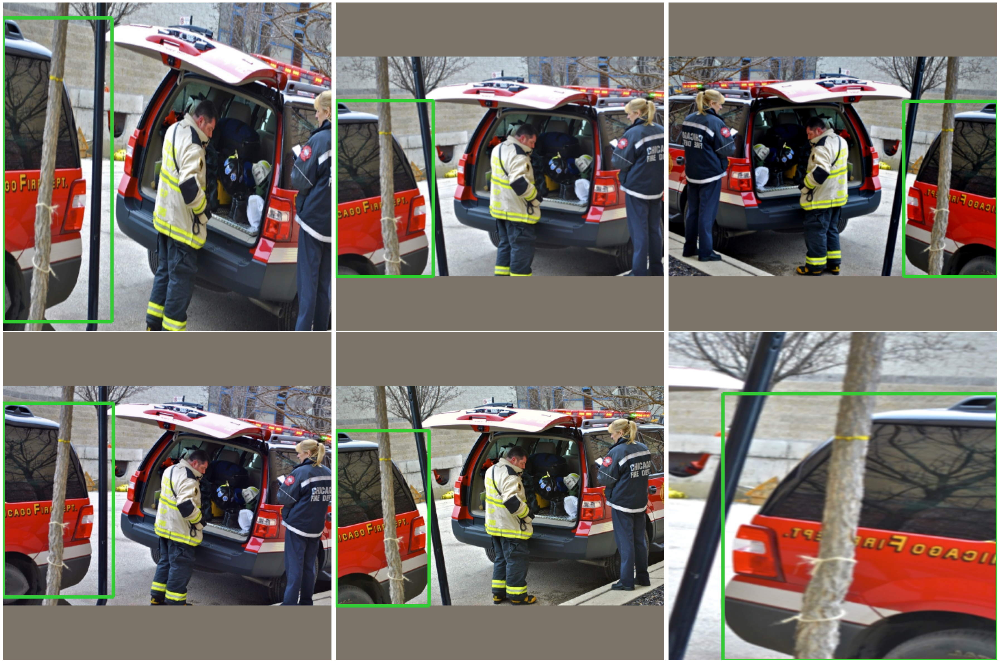

In [3]:
%matplotlib inline
flywheel.load_annotations(image_size=480, show=True, reinit=True)

INFO     - Loading model... | data_flywheel.flywheel:load_model:198


  0%|          | 0/131902412 [00:00<?, ?B/s]

2024-04-15 06:33:18,566 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2024-04-15 06:33:18,566 - mmcv - INFO - load model from: torchvision://resnet50
2024-04-15 06:33:18,567 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
2024-04-15 06:33:18,611 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2024-04-15 06:33:18,620 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2024-04-15 06:33:18,639 - mmcv - INFO - initialize VFNetHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'Normal', 'name': 'vfnet_cls', 'std': 0.01, 'bias_prob': 0.01}}
2024-04-15 06:33:18,657 - mmcv - INFO - 
backbone.conv1.weight - torch.Size([64, 3, 7, 7]): 
PretrainedInit: load from torchvision://resnet50 
 
2024-04-15 06:33:18,658 - mmcv - INFO -

load checkpoint from local path: checkpoints/vfnet/vfnet_r50_fpn_mstrain_2x_coco_20201027-7cc75bd2.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.vfnet_cls.weight: copying a param with shape torch.Size([80, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([1, 256, 3, 3]).
size mismatch for bbox_head.vfnet_cls.bias: copying a param with shape torch.Size([80]) from checkpoint, the shape in current model is torch.Size([1]).


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


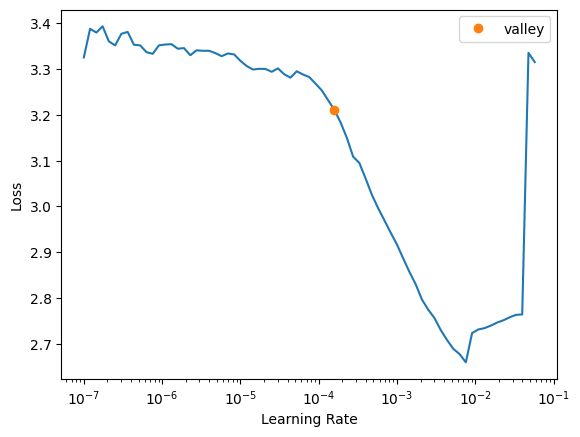

In [4]:
flywheel.load_model(batch_size=16)

INFO     - Training model... | data_flywheel.flywheel:train_model:229


epoch,train_loss,valid_loss,COCOMetric,time
0,1.585062,1.508120,0.263874,04:05


Better model found at epoch 0 with valid_loss value: 1.5081195831298828.


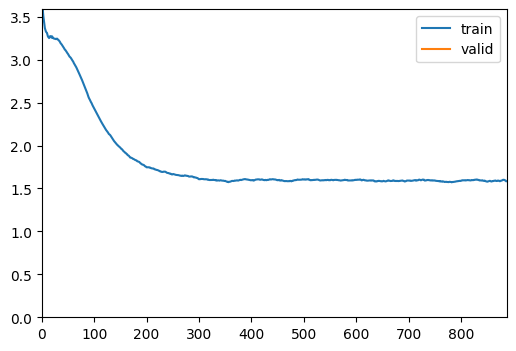

epoch,train_loss,valid_loss,COCOMetric,time
0,1.469645,1.380276,0.296353,04:23


Better model found at epoch 0 with valid_loss value: 1.3802757263183594.


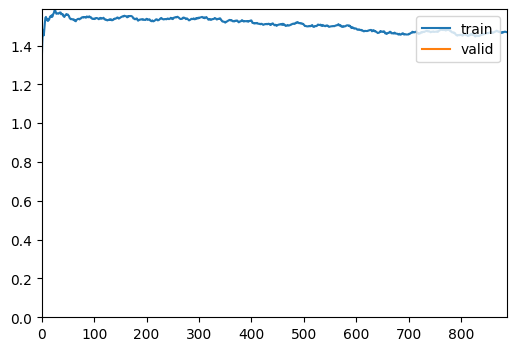

In [5]:
flywheel.train_model(lr=3e-4, epoch=1, freeze_epoch=1)

INFO     - Identifying most incorrect examples... | data_flywheel.flywheel:get_most_wrong:244
INFO     - Losses returned by model: ['loss_cls', 'loss_bbox'] | icevision.models.interpretation:plot_top_losses:220


  0%|          | 0/3547 [00:00<?, ?it/s]

  0%|          | 0/444 [00:00<?, ?it/s]

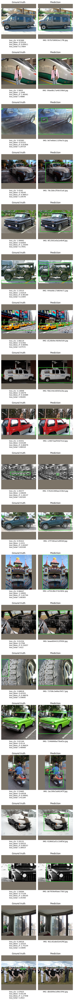

In [6]:
annotations_to_review = flywheel.get_most_wrong(method='top-loss')

In [7]:
len(flywheel.annotations_to_review)

3547

In [8]:
flywheel.annotations_to_review

['957b708902ec17f6.xml',
 '99ae8b17a48339b8.xml',
 'b67e6bdc132fea7a.xml',
 '78c1bbc2f5dc01a0.xml',
 '8f13561e0a2a4b4f.xml',
 '444a9dc17d604e71.xml',
 'd126b9ec4b06e5d4.xml',
 'f0b144e3d565e2ba.xml',
 'c29873aef44d74cd.xml',
 '576261989ae193b4.xml',
 '27f7382a21d9f2bf.xml',
 'a793c8bc57dc969c.xml',
 'beae8944312f5f09.xml',
 '73708c3e66a7bf17.xml',
 '7248d66ba75baf2a.xml',
 '2ac399c5a0624f7f.xml',
 '6186d1a51c10df3d.xml',
 'de7959e90aec75b5.xml',
 '4b1c82abd1b42f0f.xml',
 'db0d99e1d96c5f40.xml',
 'e08e013898d3fc6b.xml',
 'f0705bc34db87ca7.xml',
 '19407c3be5902c49.xml',
 'c637ff05dba9e776.xml',
 '6ee748fe67445382.xml',
 '96469a099f8daa6a.xml',
 'd222ebdac0400023.xml',
 'd51688e3b39ff5c8.xml',
 '8c04bdb7675fec32.xml',
 'f4739ac86b064b97.xml',
 '1ea0d861d77b3f17.xml',
 '590fbbf614722c04.xml',
 'e567712f12f13f0b.xml',
 '4cb38c99d8b18b2f.xml',
 'ed5bbf16ea9f25f4.xml',
 '9b43f17128a5da97.xml',
 'ec989037d34ad49b.xml',
 '4dbbefdf4d373e43.xml',
 '181f1c41da35a83d.xml',
 'c51549728a7bc29b.xml',


In [ ]:
flywheel.relabel_data()

In [ ]:
## Export to fastdup format

flywheel.export_annotations('export.parquet')